<a href="https://colab.research.google.com/github/lillelilla/Store-Sales/blob/master/0_Appendix_Choose_lags_and_windows.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 1. Feature engineering
In this notebook, we will create a feature engineering pipeline for:
* Date features
* Lag features
* Window features
* Trend features
* Categorical features

We will use the full base dataset:
* fit_transform on the train  set, and
* transform on the test set


# 2. Dataset Description


**train.csv**
The training data, comprising time series of features store_nbr, family, and onpromotion as well as ***the target sales***.
* **store_nbr** identifies the store at which the products are sold.
* **family** identifies the type of product sold.
* **onpromotion** gives the total number of items in a product family that were being promoted at a store at a given date.

* **sales** gives the total sales for a product family at a particular store at a given date. Fractional values are possible since products can be sold in fractional units (1.5 kg of cheese, for instance, as opposed to 1 bag of chips).

**test.csv**
* The test data, having the same features as the training data. You will predict the target sales for the dates in this file.
* The dates in the test data are for the 15 days after the last date in the training data.

**stores.csv**
Store metadata, including:
* **city**
* **state**
* **type**
* **cluster**: a grouping of similar stores.

**transactions.csv**
* date
* store_nbr
* transactions

**oil.csv**
* Daily oil price. Includes values during both the train and test data timeframes. (Ecuador is an oil-dependent country and it's economical health is highly vulnerable to shocks in oil prices.)

**holidays_events.csv**
* Holidays and Events, with metadata
* NOTE: Pay special attention to the transferred column. A holiday that is transferred officially falls on that calendar day, but was moved to another date by the government. A transferred day is more like a normal day than a holiday. To find the day that it was actually celebrated, look for the corresponding row where type is Transfer. For example, the holiday Independencia de Guayaquil was transferred from 2012-10-09 to 2012-10-12, which means it was celebrated on 2012-10-12. Days that are type Bridge are extra days that are added to a holiday (e.g., to extend the break across a long weekend). These are frequently made up by the type Work Day which is a day not normally scheduled for work (e.g., Saturday) that is meant to payback the Bridge.
* Additional holidays are days added a regular calendar holiday, for example, as typically happens around Christmas (making Christmas Eve a holiday).

**Additional Notes**
* Wages in the public sector are paid every two weeks on the 15 th and on the last day of the month. Supermarket sales could be affected by this.
* A magnitude 7.8 earthquake struck Ecuador on April 16, 2016. People rallied in relief efforts donating water and other first need products which greatly affected supermarket sales for several weeks after the earthquake.

# 3. Import libraries

In [ ]:
# "magic commands" to enable autoreload of the imported packages
%load_ext autoreload
%reload_ext autoreload
%autoreload 2

import re
from pathlib import Path
import joblib

# Data Manipulation
import numpy as np
import pandas as pd
pd.options.display.max_colwidth = 500
pd.options.display.max_columns = 100
pd.options.display.float_format = '{:.2f}'.format
# pd.options.display.precision

# Data visualization
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline


# Sklearn
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler
from sklearn.pipeline import make_union, make_pipeline
from sklearn.compose import make_column_selector, make_column_transformer
from sklearn import set_config; set_config(display='diagram')

set_config(transform_output="pandas")

# Sktime
!pip install sktime --quiet
from sktime.transformations.series.date import DateTimeFeatures
from sktime.transformations.series.summarize import WindowSummarizer


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# 1. Set directories

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

# # Directory containing the raw data
# raw_data_dir = Path("/content/drive/MyDrive/Colab Notebooks/Store-Sales/raw_data")

# Directory containing the base dataset for feature engineering
base_data_dir = Path("/content/drive/MyDrive/Colab Notebooks/Store-Sales/base_data")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Load the full base dataset

In [ ]:
# Load the base dataset
in_dir = base_data_dir / "data"

df_full = pd.read_parquet(
    path=in_dir,
    engine="pyarrow"
)

# Make a copy
df = df_full.copy()

In [ ]:
# Select and reorder the columns
columns = [
           'date', 'family', 'store_nbr',
           'sales', 'onpromotion', 'transactions', 'oil_price_interpolated',    # NOTE: each value in the "transactions" column is the number of transactions per store for a given date
           'city', 'state', 'type', 'cluster',
           'is_Local_holiday', 'is_Regional_holiday', 'is_National_holiday',
           'wage_day', 'earthquake_day', 'earthquake_impact'
           ]

df = df[columns]


# Sort the dataframe
df = df.sort_values(["store_nbr", "family", "date"])


# Set date as index
df = df.set_index(["date"])
df.head()

,family,store_nbr,sales,onpromotion,transactions,oil_price_interpolated,city,state,type,cluster,is_Local_holiday,is_Regional_holiday,is_National_holiday,wage_day,earthquake_day,earthquake_impact
date,,,,,,,,,,,,,,,,
2013-01-01,AUTOMOTIVE,1,0.00,0.00,0.00,93.14,Quito,Pichincha,D,13,no_holiday,no_holiday,National,yes,no,no
2013-01-02,AUTOMOTIVE,1,2.00,0.00,2111.00,93.14,Quito,Pichincha,D,13,no_holiday,no_holiday,no_holiday,no,no,no
2013-01-03,AUTOMOTIVE,1,3.00,0.00,1833.00,92.97,Quito,Pichincha,D,13,no_holiday,no_holiday,no_holiday,no,no,no
2013-01-04,AUTOMOTIVE,1,3.00,0.00,1863.00,93.12,Quito,Pichincha,D,13,no_holiday,no_holiday,no_holiday,no,no,no
2013-01-05,AUTOMOTIVE,1,5.00,0.00,1509.00,93.12,Quito,Pichincha,D,13,no_holiday,no_holiday,no_holiday,no,no,no


# Choose lags and windows


## Plot sales per family category and store_nbr

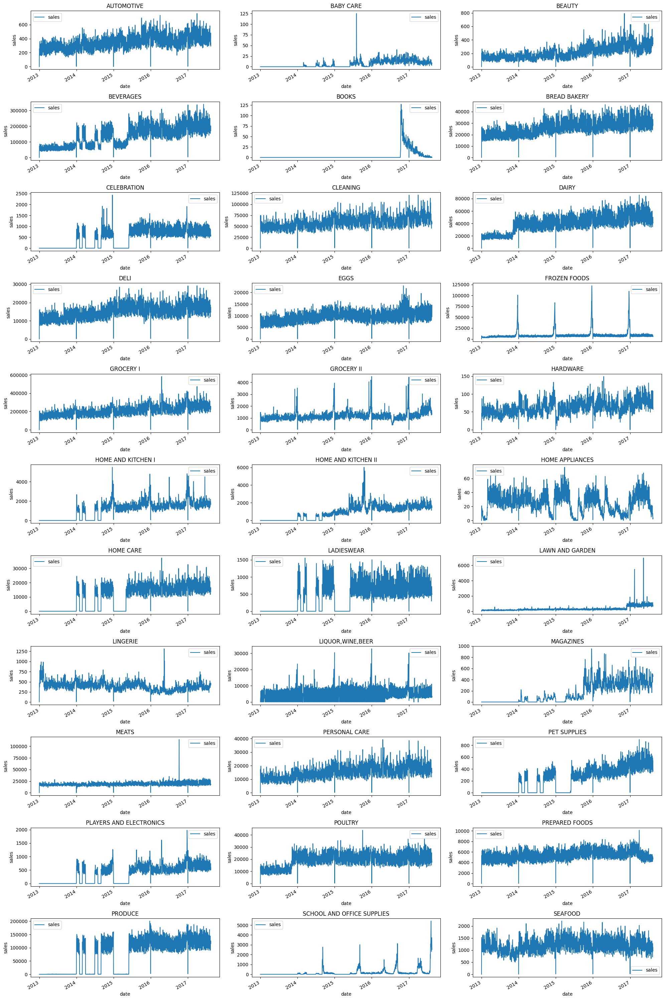

In [ ]:
# Get 33 family categories
n_series = len(df.family.unique())
families = np.array(df.family.unique())

# Plot the sum of sales series per family category
fig, axes = plt.subplots(nrows=n_series // 3, ncols=3, figsize=[20, 30])
for index, ax in enumerate(axes.flatten()):
  family = families[index]
  tmp_ = df.loc[:'2017-08-15']
  tmp_ = tmp_.groupby(["family", "date"])[["sales"]].sum()
  tmp_.loc[family, ["sales"]].plot(ax=ax)

  ax.set_title(family)
  ax.set_xlabel("date")
  ax.set_ylabel("sales")

fig.tight_layout()
fig.show()


#A magnitude 7.8 earthquake struck Ecuador on April 16, 2016.
#Regions of Manta, Pedernales and Portoviejo

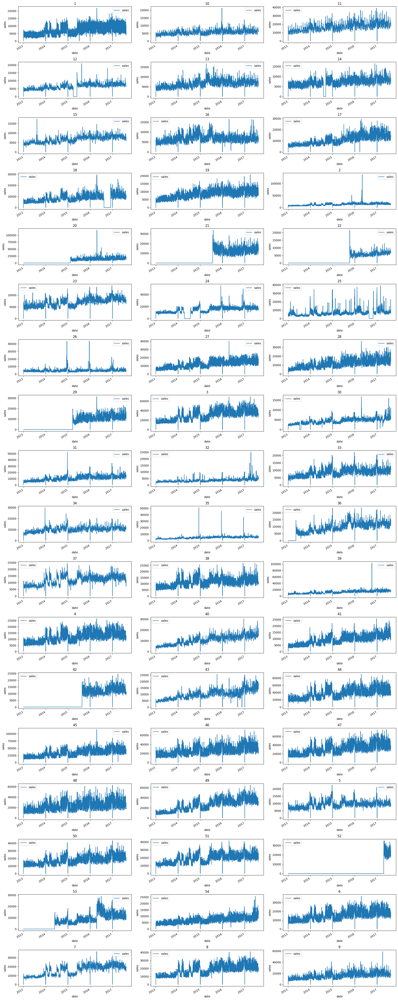

In [ ]:
# Get 54 stores
n_series = len(df.store_nbr.unique())
stores = np.array(df.store_nbr.unique())

# Plot the sum of sales series per store_nbr
fig, axes = plt.subplots(nrows=n_series // 3, ncols=3, figsize=[20, 50])
for index, ax in enumerate(axes.flatten()):
  store = stores[index]
  idx= pd.IndexSlice
  tmp_ = df.loc[:'2017-08-15']
  tmp_ = tmp_.groupby(["store_nbr", "date"])[["sales"]].sum()
  tmp_.loc[store, ["sales"]].plot(ax=ax)

  ax.set_title(store)
  ax.set_xlabel("date")
  ax.set_ylabel("sales")

fig.tight_layout()
fig.show()

#A magnitude 7.8 earthquake struck Ecuador on April 16, 2016.
#People rallied in relief efforts donating water and other first need products which greatly affected supermarket sales for several weeks after the earthquake.

## Plot to check weekly and yearly seasonality of "sales" per store

Domain knowledge/ assumptions:

* Sales of each store on a given date would be related to the historical sales in a short term period. Therefore, a small number of recent lags would be reasonable (e.g., lag of 1 day, 2 day, 3 day)

* We might expect a weekly pattern to sales due to consumers' buying patterns and some specific events. For example, sales in weekends can behave differently to sales during weekdays. This would suggest a weekly seasonality, thus a lag of 1 week (7 days) could be helpful.

* Different times of year corresponds to different seasons/events/holidays and potentially changes in buying patterns
This could introduce a yearly seasonality and therefore a lag of 1 year (365 days) could be considered.

We will do some plots to check these assumptions



In [ ]:
# Group the "sales", "onpromotion", and "transactions" by "store_nbr" and "date"
# to get the totals of "sales", "onpromotion", and "transactions" per store each day
check_ = df.query("date <= '2017-08-15'").copy()
check_ = check_.groupby(["store_nbr", "date"])[["sales", "onpromotion", "transactions"]].agg({"sales": "sum", "onpromotion": "sum", "transactions": "mean"}).reset_index().set_index("date")

# Extract some date features to use to check for seasonality of "sales"
check_["day_of_week"] = check_.index.dayofweek
check_["day_of_month"] = check_.index.day
check_["week_of_year"] = check_.index.isocalendar().week
check_["month"] = check_.index.month
check_["quarter"] = check_.index.quarter

check_.head()

,store_nbr,sales,onpromotion,transactions,day_of_week,day_of_month,week_of_year,month,quarter
date,,,,,,,,,
2013-01-01,1,0.00,0.00,0.00,1,1,1,1,1
2013-01-02,1,7417.15,0.00,2111.00,2,2,1,1,1
2013-01-03,1,5873.24,0.00,1833.00,3,3,1,1,1
2013-01-04,1,5919.88,0.00,1863.00,4,4,1,1,1
2013-01-05,1,6318.79,0.00,1509.00,5,5,1,1,1


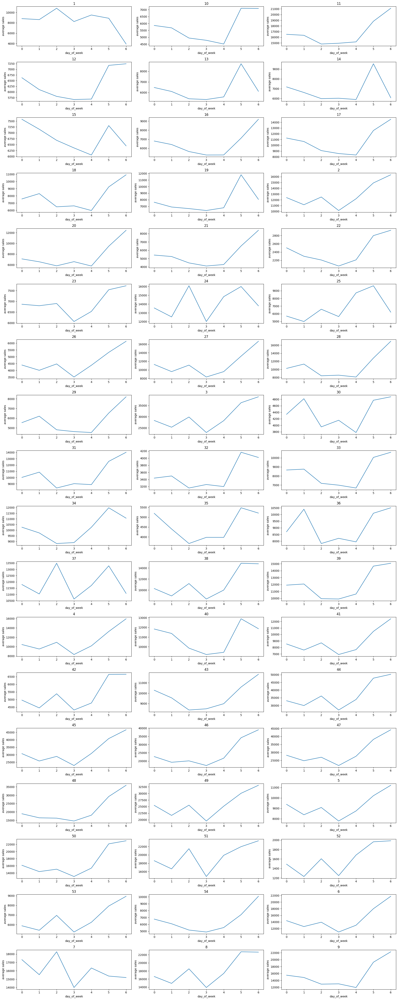

In [ ]:
# Check Weekly Seasonality of "sales"

# Get 54 stores
stores = check_.store_nbr.unique()
n_series = len(stores)

# Plot the average sales by day_of_week for each store
fig, axes = plt.subplots(nrows=n_series // 3, ncols=3, figsize=[20, 50])
for index, ax in enumerate(axes.flatten()):
  store = stores[index]
  check_[check_.store_nbr == store].groupby("day_of_week")["sales"].mean().plot(ax=ax)
  ax.set_title(store)
  ax.set_xlabel("day_of_week")
  ax.set_ylabel("average sales")

fig.tight_layout()
fig.show()

# We can observe clear weekly patterns amongst all the stores
# A lag of 7 days should be reasonable.

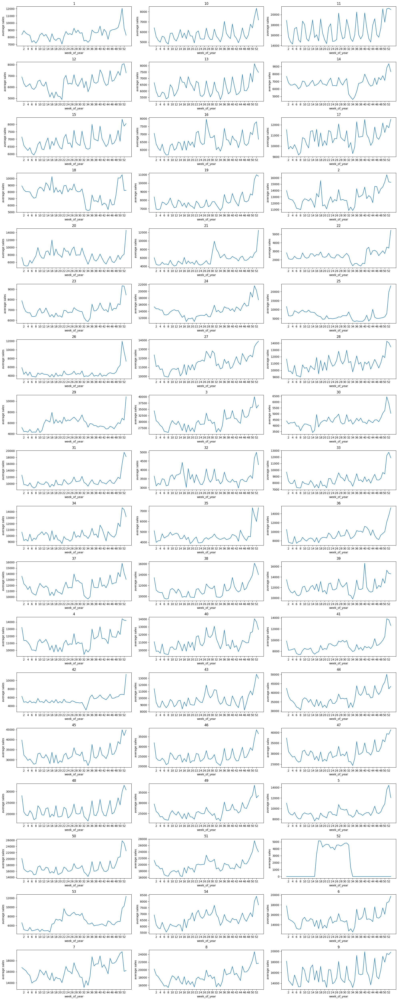

In [ ]:
# Check Yearly Seasonality of "sales"

# Get 54 stores
stores = check_.store_nbr.unique()
n_series = len(stores)

# Plot the average sales by week_of_year for each store
fig, axes = plt.subplots(nrows=n_series // 3, ncols=3, figsize=[20, 50])
for index, ax in enumerate(axes.flatten()):
  store = stores[index]
  check_[check_.store_nbr == store].groupby("week_of_year")["sales"].mean().plot(ax=ax)
  ax.set_title(store)
  ax.set_xlabel("week_of_year")
  ax.set_xticks(np.arange(2, 54, 2))
  ax.set_ylabel("average sales")

fig.tight_layout()
fig.show()

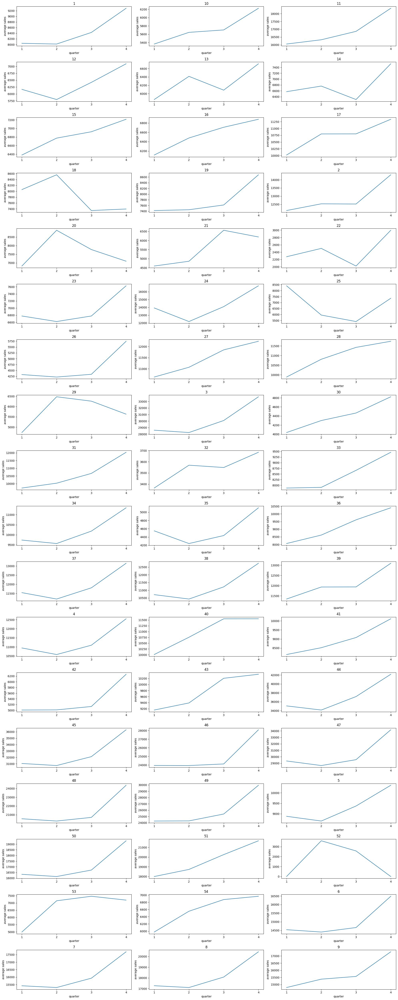

In [ ]:
# Check Quarterly Seasonality of "sales"

# Get 54 stores
stores = check_.store_nbr.unique()
n_series = len(stores)

# Plot the average sales by quarter for each store
fig, axes = plt.subplots(nrows=n_series // 3, ncols=3, figsize=[20, 50])
for index, ax in enumerate(axes.flatten()):
  store = stores[index]
  check_[check_.store_nbr == store].groupby("quarter")["sales"].mean().plot(ax=ax)
  ax.set_title(store)
  ax.set_xlabel("quarter")
  ax.set_xticks(np.arange(1,5,1))
  ax.set_ylabel("average sales")

fig.tight_layout()
fig.show()

# A lag of 91 days

<ipython-input-31-8e7a2437edab>:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(ncols=2, figsize=[15, 5])


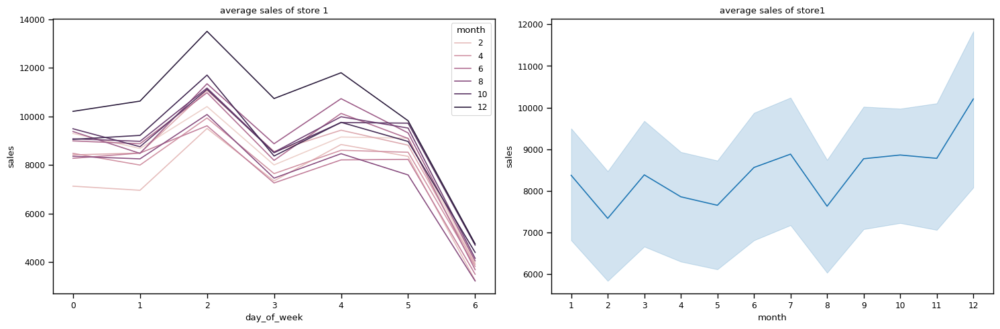

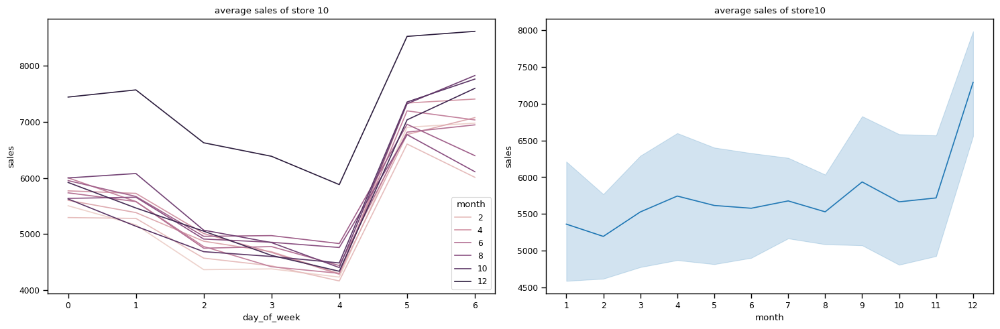

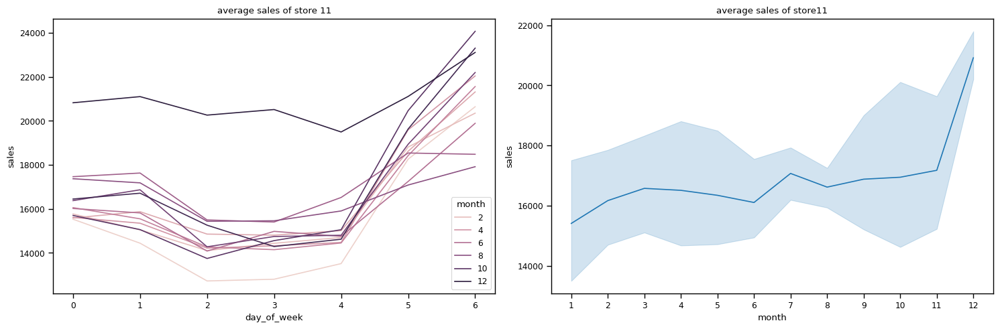

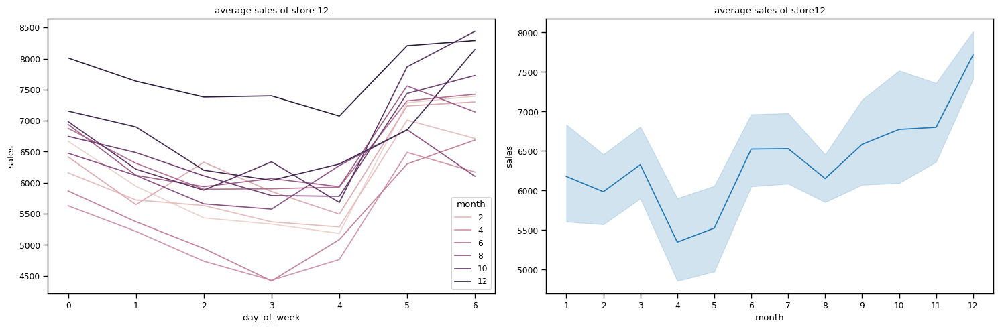

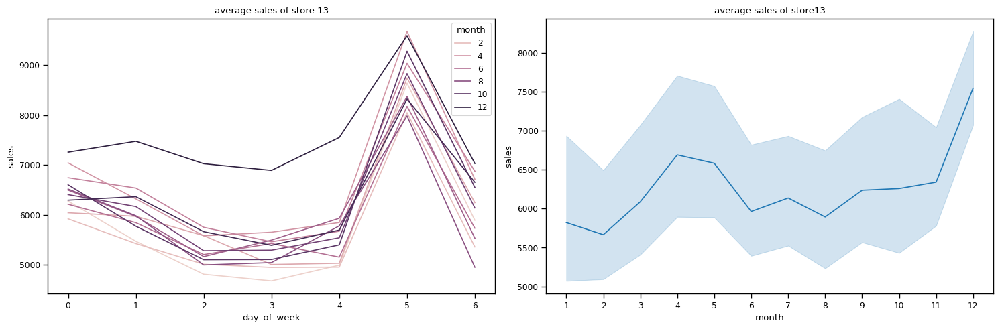

...

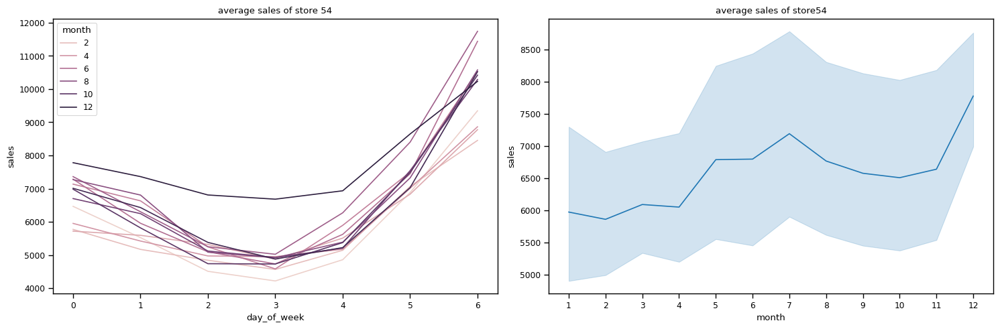

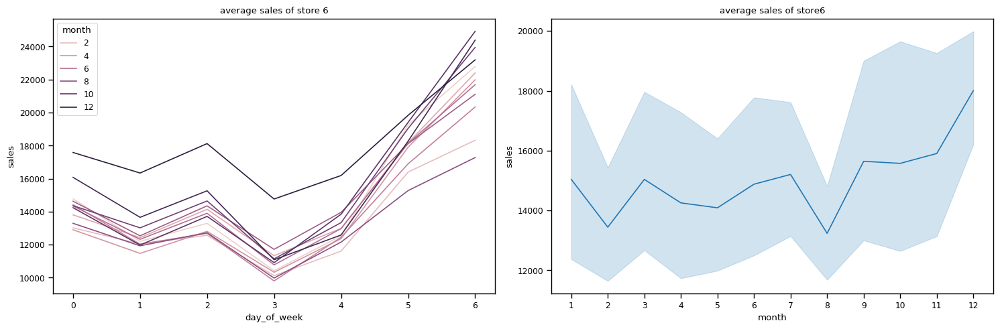

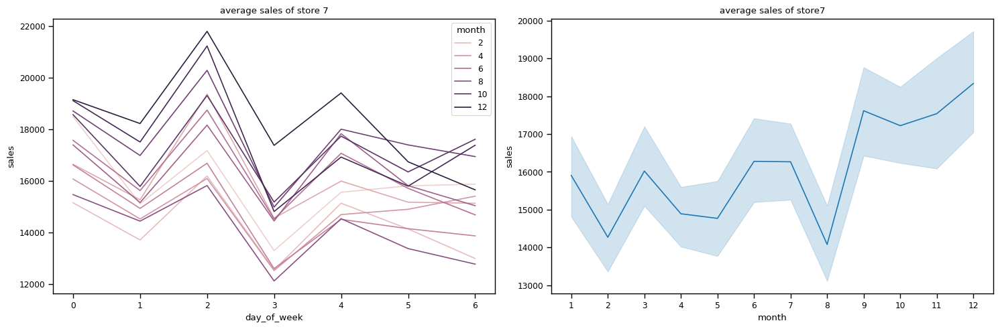

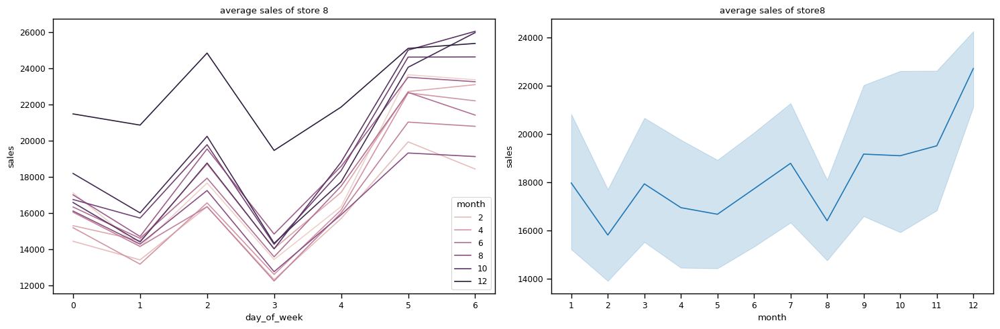

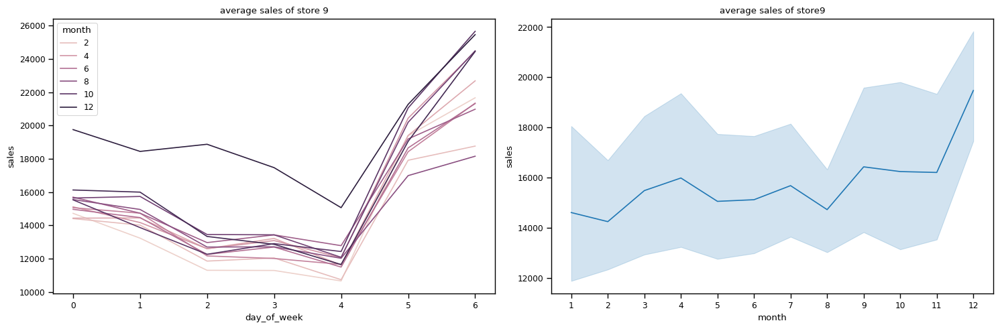

In [ ]:
# Check Yearly Seasonality of "sales"
# Get 54 stores
stores = check_.store_nbr.unique()
n_series = len(stores)

with sns.plotting_context("paper"):
  for store in stores:
    tmp_ = check_[check_.store_nbr == store].groupby(["month", "day_of_week"])[["sales"]].mean().reset_index()

    fig, ax = plt.subplots(ncols=2, figsize=[15, 5])

    sns.lineplot(data=tmp_, x="day_of_week", y="sales", hue="month", ax=ax[0])
    ax[0].set_title("average sales of store " + store)

    sns.lineplot(data=tmp_, x="month", y="sales", ax=ax[1])
    ax[1].set_xticks(np.arange(1, 13, 1))
    ax[1].set_title("average sales of store" + store)


    fig.tight_layout()
    fig.show()


# We can also observe clear patterns here: e.g. sales increase around some last weeks/months of the year.
# A lag of 1 year (365 days) could be reasonable

## Using correlation based measures: ACF, PACF, and CCF (total sales per day)

In [ ]:
# Run pip install if getting "ImportError" when importing MSTL from from statsmodels.tsa.seasonal
# !pip show statsmodels
!pip install statsmodels==0.14.0 --quiet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.1/10.1 MB 66.6 MB/s eta 0:00:00


In [ ]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.nonparametric.smoothers_lowess import lowess
from statsmodels.tsa.stattools import ccf, adfuller
from statsmodels.tsa.seasonal import seasonal_decompose, STL, MSTL
from statsmodels.tsa import seasonal
from matplotlib.ticker import MaxNLocator

In [ ]:
# Group the "sales", "onpromotion", and "transactions" by "store_nbr" and "date"
# to get the totals of "sales", "onpromotion", and "transactions" per store each day
df_ = df.query("date <= '2017-08-15'").reset_index().copy()
sales_ = df_.groupby(["store_nbr", "date"])[["sales"]].sum()
transactions_ = df_[["store_nbr", "date", "transactions"]]
check_ = sales_.merge(transactions_, how="left", left_on=["store_nbr", "date"], right_on=["store_nbr", "date"])

# Get the average "sales" and "transactions" each day
check_ = check_.groupby("date")[["sales", "transactions"]].mean()
check_

,sales,transactions
date,,
2013-01-01,46.51,14.26
2013-01-02,9186.90,1726.20
2013-01-03,6693.73,1453.78
2013-01-04,6564.07,1453.59
2013-01-05,8839.82,1732.83
...,...,...
2017-08-11,15303.22,1658.35
2017-08-12,14678.34,1665.31
2017-08-13,16030.37,1592.46


sales--Origin: 
 ADF statistic: -2.6161957055045657 
 p-value: 0.08969593042164759
sales--After transformation: 
 ADF statistic: -11.497599478166922 
 p-value: 4.573775318185299e-21 

transactions--Origin: 
 ADF statistic: -6.280489776820081 
 p-value: 3.807129830268024e-08
transactions--After transformation: 
 ADF statistic: -12.032574342246651 
 p-value: 2.8514927342561466e-22 



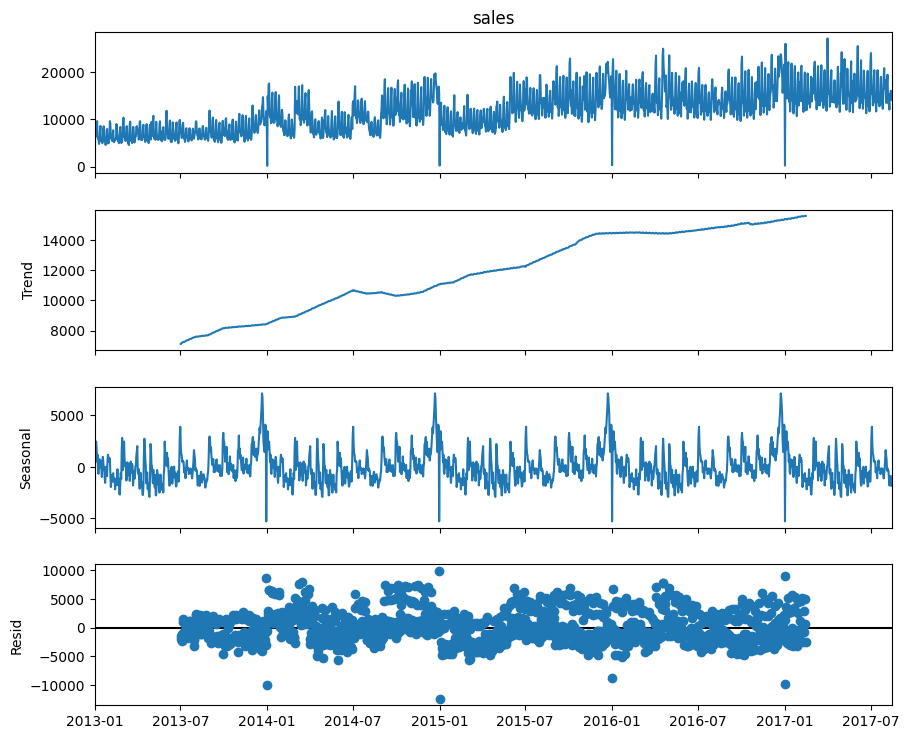

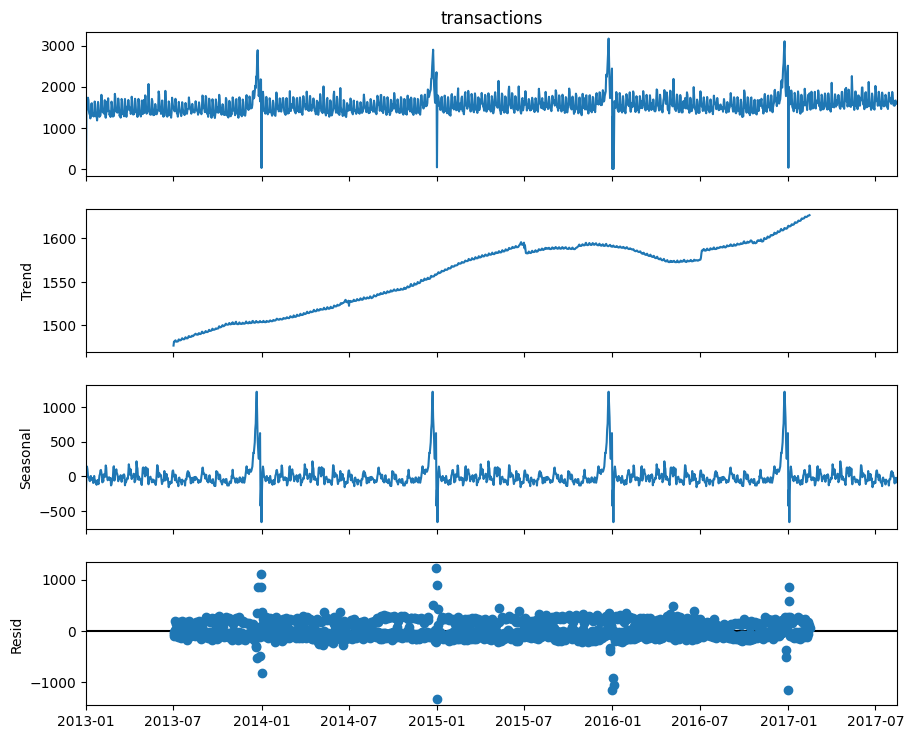

In [ ]:
cols = ['sales', "transactions"]

# Use Augmented Dickey-fuller test
for col in cols:
  # Decomposing the time series: Additive Decomposition (y = Trend + Seasonal + Residuals)
  decomposition_add = seasonal_decompose(check_[col], model='additive', period=365)   # 365 days

  fig = decomposition_add.plot()
  fig.tight_layout()
  fig.set_size_inches((10, 8))
  fig.show()

  # ADF test
  adf_result = adfuller(check_[col])

  print(f'{col}--Origin: \n ADF statistic: {adf_result[0]} \n p-value: {adf_result[1]}')

  # Apply transformation and do ADF test again
  diff_ = check_[col].diff(1).dropna()
  adf_result_diff = adfuller(diff_)
  print(f'{col}--After transformation: \n ADF statistic: {adf_result_diff[0]} \n p-value: {adf_result_diff[1]} \n')

# H0:the time series is not-stationary
# We cannot reject the H0, meaning that our time series is not stationary

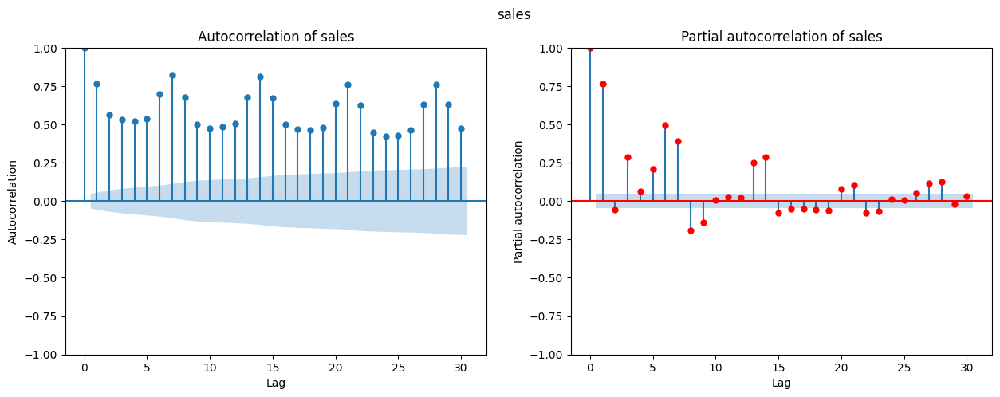

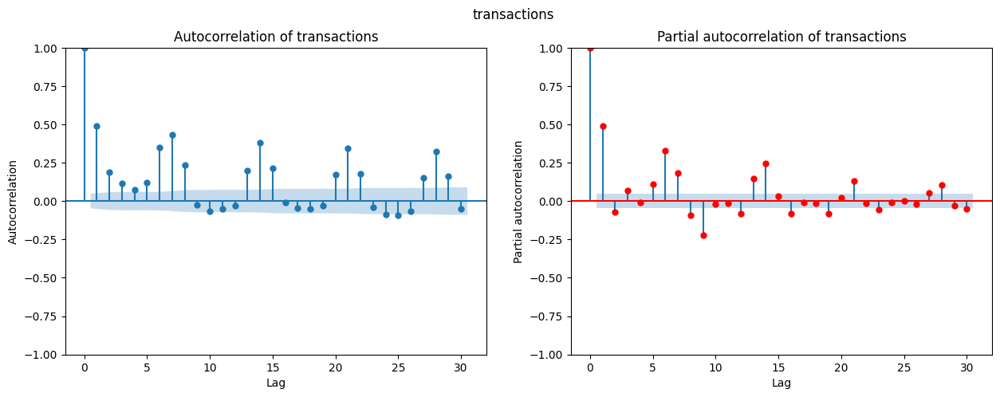

In [ ]:
cols = ['sales', 'transactions']

# 30 lags
for col in cols:
  fig, ax = plt.subplots(ncols=2, figsize=[15, 5])
  #ACF
  plot_acf(check_[col], lags=30, ax=ax[0])
  ax[0].set_title(f"Autocorrelation of {col}")
  ax[0].set_xlabel("Lag")
  ax[0].set_ylabel("Autocorrelation")
  #PACF
  plot_pacf(check_[col], lags=30, ax=ax[1], method="ywm", c='red')
  ax[1].set_title(f"Partial autocorrelation of {col}")
  ax[1].set_xlabel("Lag")
  ax[1].set_ylabel("Partial autocorrelation")
  fig.suptitle(col)

    # For sales, onpromotion, transactions:
    # The ACFs has peaks at 7 day periods (a lag of 7). This is confirmed in the PACFs when we see peaks at a lag of 7

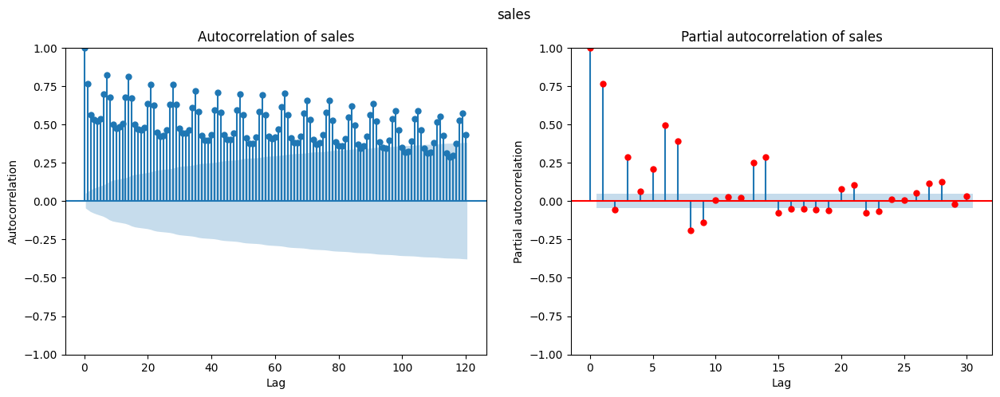

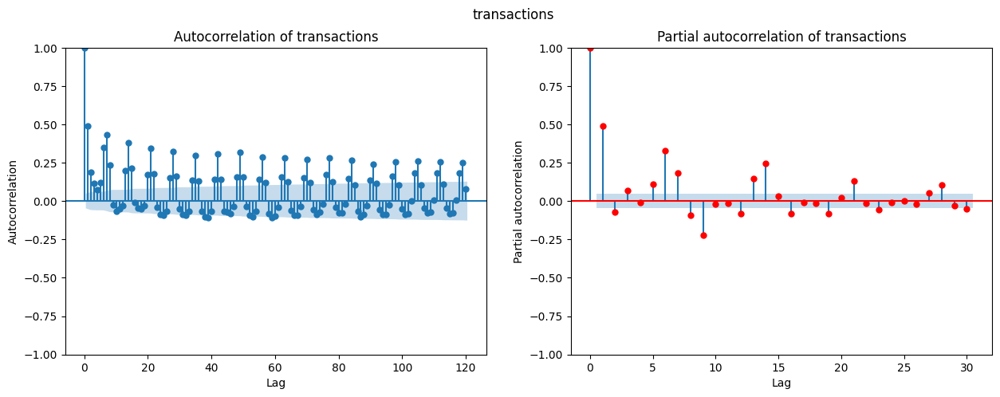

In [ ]:
cols = ['sales', 'transactions']

# 120 lags
for col in cols:
  fig, ax = plt.subplots(ncols=2, figsize=[15, 5])
  #ACF
  plot_acf(check_[col], lags=120, ax=ax[0])
  ax[0].set_title(f"Autocorrelation of {col}")
  ax[0].set_xlabel("Lag")
  ax[0].set_ylabel("Autocorrelation")
  #PACF
  plot_pacf(check_[col], lags=30, ax=ax[1], method="ywm", c='red')
  ax[1].set_title(f"Partial autocorrelation of {col}")
  ax[1].set_xlabel("Lag")
  ax[1].set_ylabel("Partial autocorrelation")
  fig.suptitle(col)

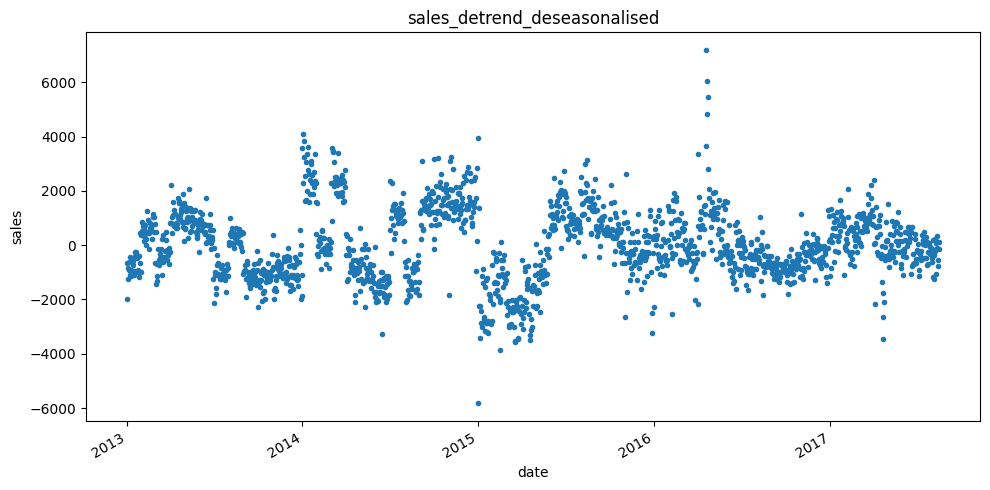

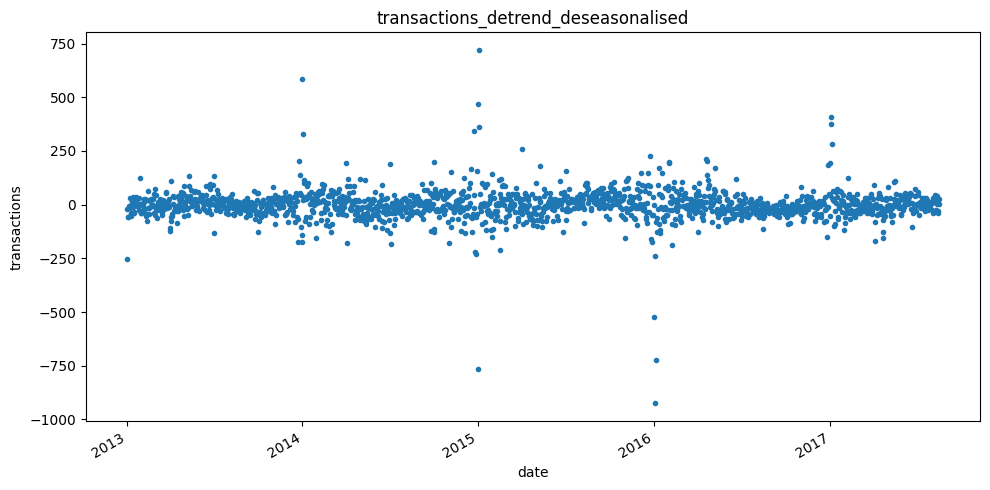

In [ ]:
cols = ['sales', 'transactions']

# De-train and de-seasonalize the cols
for col in cols:
  result = MSTL(                      # Season-Trend decomposition using LOESS for multiple seasonalities (weekly and monthly seasonality )
      endog=check_[col],              # Data to be decomposed.
      periods=[7, 28, 91, 365]                 # Periodicity of the seasonal components.
      ).fit()

  # fig = result.plot()
  # fig.set_size_inches((10, 10))

  fig, ax = plt.subplots(figsize=[10, 5])
  result.resid.plot(ax=ax, marker=".", linestyle="None")
  ax.set_xlabel("date")
  ax.set_ylabel(col)
  col_name = col + "_detrend_deseasonalised"
  ax.set_title(col_name)
  check_[col_name] = result.resid
  plt.tight_layout()

  # display(check_.head())

  #We see that there is less structure in the residuals (i.e., after substracting trend and seasonality).
  #But it doesn't look like white noise. So there might still be some structure. Let's look at the ACF and PACF of this.

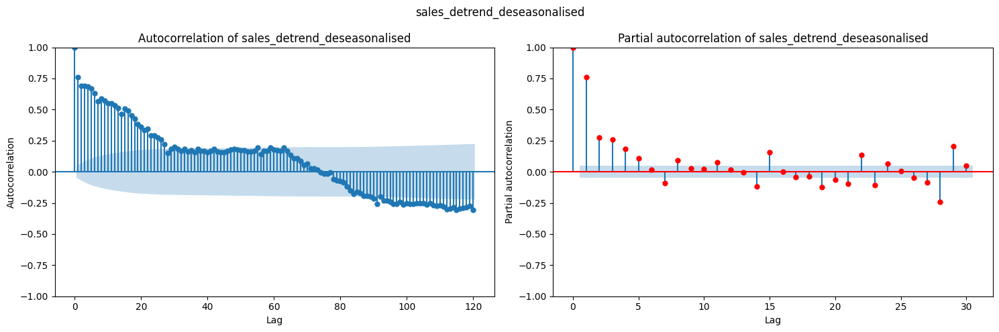

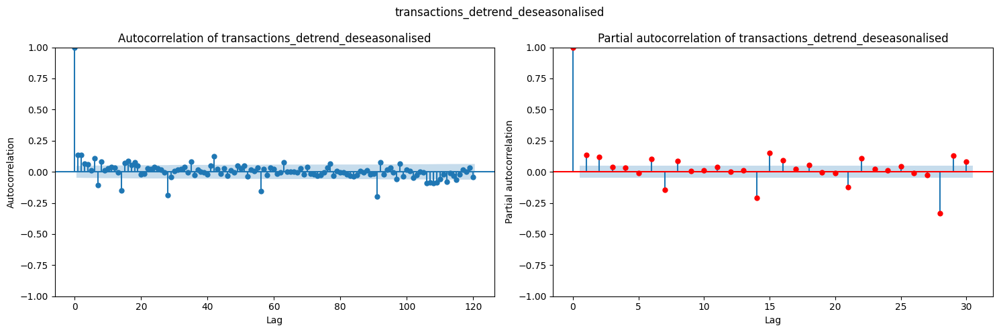

In [ ]:
for col in [col for col in check_.columns if "detrend" in col]:
    fig, ax = plt.subplots(ncols=2, figsize=[15, 5])
    plot_acf(check_[col], lags=120, ax=ax[0])
    ax[0].set_title(f"Autocorrelation of {col}")
    ax[0].set_xlabel("Lag")
    ax[0].set_ylabel("Autocorrelation")
    plot_pacf(check_[col], lags=30, ax=ax[1], method="ywmle", c="r")
    ax[1].set_title(f"Partial autocorrelation of {col}")
    ax[1].set_xlabel("Lag")
    ax[1].set_ylabel("Partial autocorrelation")
    fig.suptitle(col)
    plt.tight_layout()

#The ACF shows a decay pattern now which means that data is closer to being stationary (the ACF decaying quickly is one indicator of a stationary time series).
#The PACF suggests that a lag of 1 could be useful. A lag of 7 could also be considered